# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="5,6,7"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

In [4]:
# global variables
image_size = (128,128,64)

# 2. MONAI Dataloader

In [5]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=image_size),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3)
    ]
)

In [7]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 25.32379388809204 seconds since the loop started


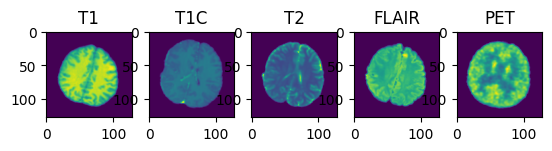

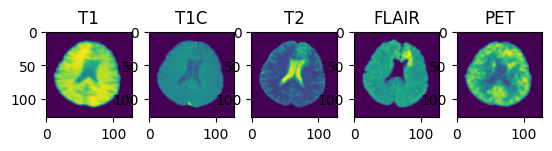

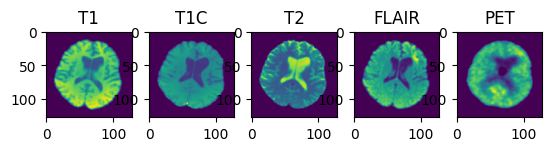

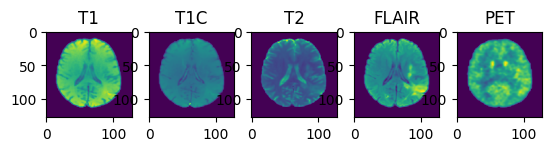

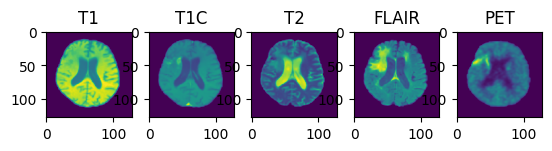

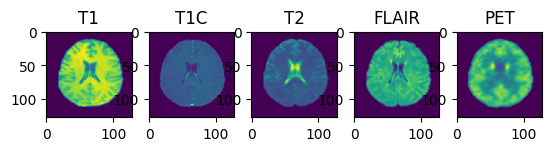

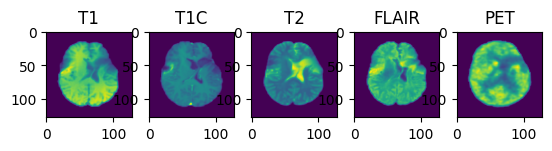

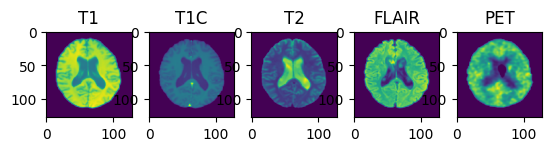

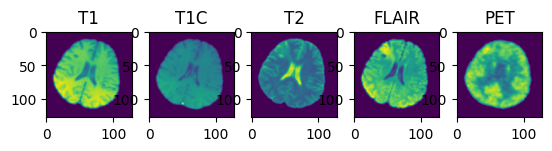

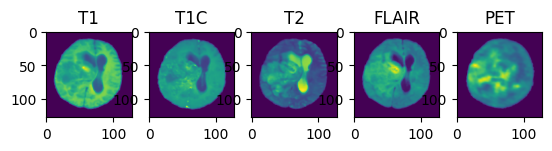

In [8]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [9]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

train_metric_ds = CacheDataset(data=dictionary_train[:10], transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_metric_loader = DataLoader(train_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                                                                      | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▍                                                                           | 1/185 [01:12<3:43:38, 72.93s/it]

Loading dataset:   1%|▊                                                                           | 2/185 [01:14<1:34:08, 30.87s/it]

Loading dataset:   2%|█▎                                                                            | 3/185 [01:18<56:18, 18.56s/it]

Loading dataset:   2%|█▋                                                                            | 4/185 [01:18<34:37, 11.48s/it]

Loading dataset:   3%|██                                                                            | 5/185 [01:19<22:50,  7.62s/it]

Loading dataset:   3%|██▌                                                                           | 6/185 [01:20<15:29,  5.19s/it]

Loading dataset:   4%|██▉                                                                           | 7/185 [01:20<10:30,  3.54s/it]

Loading dataset:   4%|███▎                                                                          | 8/185 [01:20<07:30,  2.54s/it]

Loading dataset:   5%|███▊                                                                          | 9/185 [01:22<06:38,  2.26s/it]

Loading dataset:   5%|████▏                                                                        | 10/185 [01:23<05:34,  1.91s/it]

Loading dataset:   6%|████▌                                                                        | 11/185 [01:27<07:32,  2.60s/it]

Loading dataset:   6%|████▉                                                                        | 12/185 [01:29<06:54,  2.40s/it]

Loading dataset:   7%|█████▍                                                                       | 13/185 [01:29<04:59,  1.74s/it]

Loading dataset:   8%|█████▊                                                                       | 14/185 [01:31<04:50,  1.70s/it]

Loading dataset:   8%|██████▏                                                                      | 15/185 [01:32<04:18,  1.52s/it]

Loading dataset:   9%|██████▋                                                                      | 16/185 [01:35<05:12,  1.85s/it]

Loading dataset:   9%|███████                                                                      | 17/185 [01:36<05:03,  1.81s/it]

Loading dataset:  10%|███████▍                                                                     | 18/185 [01:38<04:40,  1.68s/it]

Loading dataset:  10%|███████▉                                                                     | 19/185 [01:43<07:32,  2.73s/it]

Loading dataset:  11%|████████▎                                                                    | 20/185 [01:47<07:25,  2.70s/it]

Loading dataset:  11%|████████▋                                                                    | 21/185 [01:48<06:53,  2.52s/it]

Loading dataset:  12%|█████████▏                                                                   | 22/185 [01:49<05:50,  2.15s/it]

Loading dataset:  12%|█████████▌                                                                   | 23/185 [01:52<06:35,  2.44s/it]

Loading dataset:  13%|█████████▉                                                                   | 24/185 [01:54<06:02,  2.25s/it]

Loading dataset:  14%|██████████▍                                                                  | 25/185 [01:56<05:46,  2.17s/it]

Loading dataset:  14%|██████████▊                                                                  | 26/185 [01:56<04:33,  1.72s/it]

Loading dataset:  15%|███████████▏                                                                 | 27/185 [01:58<04:31,  1.72s/it]

Loading dataset:  15%|███████████▋                                                                 | 28/185 [01:59<03:36,  1.38s/it]

Loading dataset:  16%|████████████                                                                 | 29/185 [02:00<03:42,  1.43s/it]

Loading dataset:  16%|████████████▍                                                                | 30/185 [02:01<03:29,  1.35s/it]

Loading dataset:  42%|████████████████████████████████▍                                            | 78/185 [02:02<00:07, 13.88it/s]

Loading dataset:  44%|██████████████████████████████████▏                                          | 82/185 [02:09<00:26,  3.92it/s]

Loading dataset:  46%|███████████████████████████████████▍                                         | 85/185 [02:10<00:25,  3.89it/s]

Loading dataset:  47%|████████████████████████████████████▏                                        | 87/185 [02:10<00:23,  4.14it/s]

Loading dataset:  48%|█████████████████████████████████████                                        | 89/185 [02:11<00:23,  4.05it/s]

Loading dataset:  49%|█████████████████████████████████████▉                                       | 91/185 [02:11<00:22,  4.17it/s]

Loading dataset:  50%|██████████████████████████████████████▎                                      | 92/185 [02:12<00:23,  4.04it/s]

Loading dataset:  50%|██████████████████████████████████████▋                                      | 93/185 [02:13<00:37,  2.44it/s]

Loading dataset:  51%|███████████████████████████████████████                                      | 94/185 [02:15<00:48,  1.87it/s]

Loading dataset:  51%|███████████████████████████████████████▌                                     | 95/185 [02:16<01:04,  1.40it/s]

Loading dataset:  52%|███████████████████████████████████████▉                                     | 96/185 [02:17<00:59,  1.49it/s]

Loading dataset:  52%|████████████████████████████████████████▎                                    | 97/185 [02:18<01:09,  1.27it/s]

Loading dataset:  53%|████████████████████████████████████████▊                                    | 98/185 [02:19<01:15,  1.15it/s]

Loading dataset:  54%|█████████████████████████████████████████▏                                   | 99/185 [02:21<01:32,  1.08s/it]

Loading dataset:  54%|█████████████████████████████████████████                                   | 100/185 [02:22<01:29,  1.06s/it]

Loading dataset:  58%|███████████████████████████████████████████▉                                | 107/185 [02:23<00:31,  2.48it/s]

Loading dataset:  58%|████████████████████████████████████████████▎                               | 108/185 [02:23<00:31,  2.47it/s]

Loading dataset:  60%|█████████████████████████████████████████████▌                              | 111/185 [02:24<00:20,  3.66it/s]

Loading dataset:  70%|████████████████████████████████████████████████████▉                       | 129/185 [02:24<00:04, 13.66it/s]

Loading dataset:  78%|███████████████████████████████████████████████████████████▌                | 145/185 [02:24<00:01, 24.28it/s]

Loading dataset:  87%|██████████████████████████████████████████████████████████████████▏         | 161/185 [02:24<00:00, 33.65it/s]

Loading dataset:  91%|█████████████████████████████████████████████████████████████████████▍      | 169/185 [02:24<00:00, 31.00it/s]

Loading dataset:  95%|███████████████████████████████████████████████████████████████████████▉    | 175/185 [02:24<00:00, 31.99it/s]

Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████| 185/185 [02:25<00:00,  1.28it/s]

Loading dataset:   0%|                                                                                       | 0/10 [00:00<?, ?it/s]

Loading dataset:  10%|███████▉                                                                       | 1/10 [00:08<01:12,  8.06s/it]

Loading dataset: 100%|██████████████████████████████████████████████████████████████████████████████| 10/10 [00:08<00:00,  1.24it/s]

Loading dataset:   0%|                                                                                        | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|████████████████                                                                | 1/5 [00:03<00:15,  3.92s/it]

Loading dataset:  40%|████████████████████████████████                                                | 2/5 [00:04<00:05,  1.74s/it]

Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████| 5/5 [00:04<00:00,  1.20it/s]

Loading dataset:   0%|                                                                                       | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|█▍                                                                             | 1/57 [00:47<44:07, 47.28s/it]

Loading dataset: 100%|██████████████████████████████████████████████████████████████████████████████| 57/57 [00:47<00:00,  1.20it/s]

# 3. Model Setup


In [10]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(32, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.relu = nn.ReLU()
        #self.dropout = torch.nn.Dropout(0)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        #x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [11]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Discriminator(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 1),
    strides=(2, 2, 2, 2, 1),
    num_res_units=1,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.00018)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.00011)

def discriminator_loss(gen_images, real_images):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    real = real_images.new_full((real_images.shape[0], 1), real_label)
    gen = gen_images.new_full((gen_images.shape[0], 1), gen_label)

    # Training discriminator to label 1 on real images
    realloss = disc_loss(disc_net(real_images), real) 

    # Training discriminator to label 0 on generated images
    genloss = disc_loss(disc_net(gen_images.detach()), gen)

    return (realloss + genloss) / 2


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    output = disc_net(input[:,0,:,:,:])
    cats = output.new_full(output.shape, real_label)
    fooling_disc = gen_loss(output, cats)
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    
    # Train generator to fool the discriminator into giving a score of 1, and to have a high SSIM
    return fooling_disc + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


### 3.2 Training


----------
epoch 1/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:38, 85.30s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:10, 37.03s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:14, 21.63s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:56, 14.51s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:14, 10.63s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:50,  8.36s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:22,  5.65s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.92s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.43s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.52s/it]

----------
epoch 2/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:50, 80.93s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:19, 22.21s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:59, 14.90s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:16, 10.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:51,  8.50s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:34,  6.86s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:22,  5.72s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.97s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 3/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:42, 85.71s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:15, 37.53s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:59, 14.88s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:15, 10.77s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:49,  8.29s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:34,  6.82s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.70s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.93s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.42s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.62s/it]

----------
epoch 4/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:09, 82.72s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:59, 35.94s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:11, 21.33s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.26s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:48,  8.00s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:32,  6.48s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:22,  5.59s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:14,  4.86s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.37s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.49s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.25s/it]

----------
epoch 5/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:42, 85.66s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:12, 37.23s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:56, 14.52s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:13, 10.52s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:48,  8.03s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:33,  6.70s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:22,  5.64s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.90s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.48s/it]

----------
epoch 6/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:34, 90.40s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:31, 39.16s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:28, 23.18s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:04, 15.53s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:19, 11.35s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:52,  8.74s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:34,  6.93s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:22,  5.74s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:14,  4.99s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.58s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.03s/it]

----------
epoch 7/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:17, 83.39s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:05, 36.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:12, 21.37s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:55, 14.43s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:14, 10.65s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:48,  8.17s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:32,  6.58s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:22,  5.52s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.84s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.37s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.40s/it]

----------
epoch 8/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:21, 89.22s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:30, 39.01s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:25, 22.85s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:17, 11.12s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:51,  8.51s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:34,  6.88s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:24,  6.03s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.23s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.63s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.74s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.97s/it]

----------
epoch 9/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:50, 86.40s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:20, 22.26s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.63s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:49,  8.29s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.73s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.62s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.88s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.39s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.15s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.62s/it]

----------
epoch 10/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:09, 88.10s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.34s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.45s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:59, 14.98s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:15, 10.85s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:50,  8.36s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:34,  6.95s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:23,  5.83s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:15,  5.09s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:09,  4.55s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.80s/it]

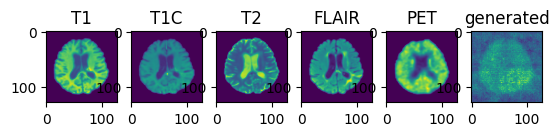

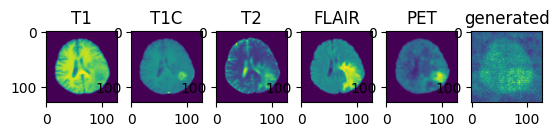

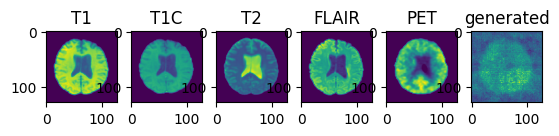

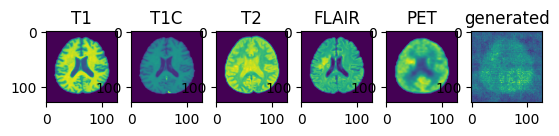

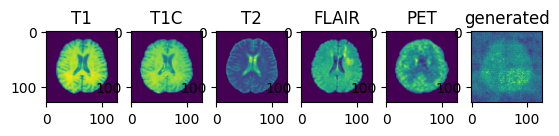

validation avg MS-SSIM: 0.2851 , train avg MS-SSIM: 0.2824
----------
epoch 11/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<15:57, 87.04s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:17, 37.76s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.01s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.68s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.67s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:49,  8.28s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.67s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.91s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.52s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.62s/it]

----------
epoch 12/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:53, 86.67s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.89s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.06s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.70s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:49,  8.19s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.63s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.63s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.88s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.39s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.50s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.57s/it]

----------
epoch 13/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:10, 88.20s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.37s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.49s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:59, 14.92s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:15, 10.72s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:49,  8.31s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:33,  6.65s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.74s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:15,  5.19s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:09,  4.77s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.40s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.71s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.76s/it]

----------
epoch 14/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:47, 91.57s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:36, 39.61s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:27, 23.09s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.36s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:17, 11.04s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.73s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.63s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:14,  4.91s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.55s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.71s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.03s/it]

----------
epoch 15/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:21, 89.19s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:26, 38.63s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:23, 22.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<02:00, 15.04s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.91s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:49,  8.32s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:33,  6.68s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:22,  5.65s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:14,  4.92s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.46s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.92s/it]

----------
epoch 16/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:36<17:41, 96.46s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:39<06:56, 41.63s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:43<03:37, 24.14s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:46<02:08, 16.06s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:50<01:20, 11.49s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:53<00:52,  8.68s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:56<00:34,  6.92s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [02:00<00:23,  5.95s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:03<00:15,  5.17s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:07<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:10<00:04,  4.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:16<00:00, 11.41s/it]

----------
epoch 17/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:50, 86.41s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:14, 37.49s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:19, 22.21s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.75s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.60s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.52s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.55s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.95s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.47s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.64s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.61s/it]

----------
epoch 18/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:47, 86.18s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:16, 37.61s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.80s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.64s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:49,  8.25s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.62s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.56s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.85s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.34s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.56s/it]

----------
epoch 19/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:48, 91.66s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:37, 39.80s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:28, 23.16s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.30s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.95s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.34s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.67s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.79s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.19s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.65s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.62s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.99s/it]

----------
epoch 20/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:22, 89.34s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:27, 38.77s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:23, 22.56s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 14.96s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:15, 10.77s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:49,  8.25s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:33,  6.63s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.56s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:14,  5.00s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.49s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.77s/it]

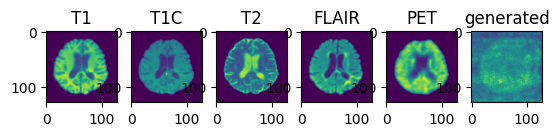

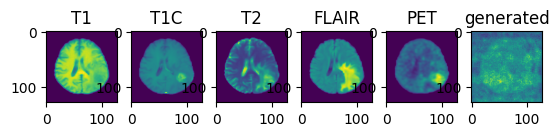

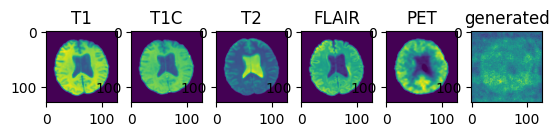

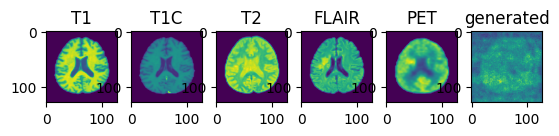

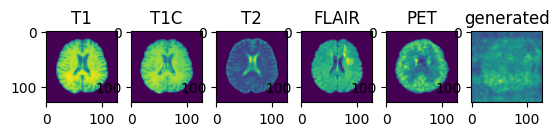

validation avg MS-SSIM: 0.1869 , train avg MS-SSIM: 0.1801
----------
epoch 21/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:31, 90.16s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:32, 39.22s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:27, 23.05s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:03, 15.42s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:17, 11.10s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.46s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.70s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.22s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.79s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.47s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.76s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.03s/it]

----------
epoch 22/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:26, 89.66s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:29, 38.91s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.67s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.97s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:50,  8.38s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:34,  6.81s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.75s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.64s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.74s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.95s/it]

----------
epoch 23/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:22, 89.36s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:28, 38.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:23, 22.62s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 15.00s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.87s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:50,  8.41s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:34,  6.85s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.88s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.15s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.17s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.58s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.89s/it]

----------
epoch 24/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:09, 93.63s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:46, 40.61s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:34, 23.80s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:06, 15.79s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:48<01:19, 11.39s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:51,  8.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:54<00:34,  6.89s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:58<00:23,  5.85s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:01<00:15,  5.11s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:05<00:09,  4.58s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:08<00:04,  4.36s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:16<00:00, 11.34s/it]

----------
epoch 25/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:36<17:43, 96.69s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:39<06:57, 41.72s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:43<03:38, 24.28s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:47<02:08, 16.10s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:51<01:22, 11.74s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:56<00:58,  9.67s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [02:00<00:38,  7.67s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [02:03<00:25,  6.31s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:06<00:16,  5.38s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:10<00:09,  4.83s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:14<00:04,  4.49s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:16<00:00,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:21<00:00, 11.76s/it]

----------
epoch 26/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<17:01, 92.89s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:43, 40.39s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:31, 23.52s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:43<02:05, 15.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:18, 11.20s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:50<00:50,  8.49s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:53<00:34,  6.82s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:22,  5.72s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:14,  4.94s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.51s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.14s/it]

----------
epoch 27/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:13, 88.46s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.40s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.52s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<02:00, 15.00s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:18, 11.15s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:51,  8.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:34,  6.90s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:22,  5.74s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.07s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:09,  4.60s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.90s/it]

----------
epoch 28/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:31, 90.18s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:31, 39.12s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.74s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.19s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.93s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.32s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.66s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:22,  5.64s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:14,  4.91s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:09,  4.54s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.96s/it]

----------
epoch 29/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<16:54, 92.25s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:40, 40.03s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:31, 23.48s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:17, 11.09s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:50,  8.44s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.75s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:22,  5.71s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.05s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.62s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.69s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.08s/it]

----------
epoch 30/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:29, 89.94s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:29, 38.99s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.71s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.17s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.99s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:50,  8.38s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:34,  6.95s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.84s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.13s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.65s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.96s/it]

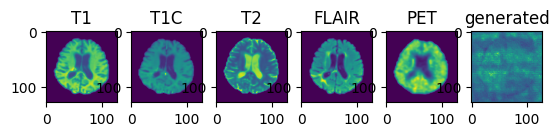

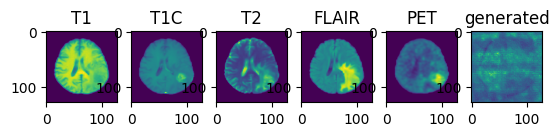

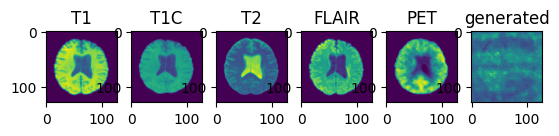

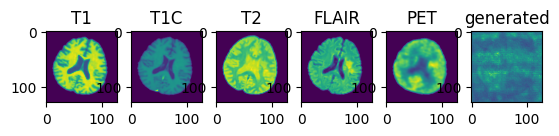

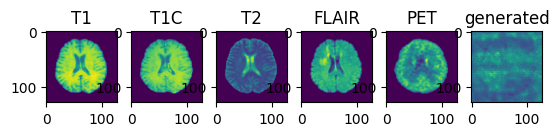

validation avg MS-SSIM: 0.0425 , train avg MS-SSIM: 0.0415
----------
epoch 31/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:44, 91.32s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:37, 39.72s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:28, 23.16s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.31s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:17, 11.07s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:51,  8.52s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.80s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.81s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.15s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.04s/it]

----------
epoch 32/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:32, 90.18s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:31, 39.10s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:26, 22.93s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.20s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.90s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.31s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.78s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.68s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:14,  4.92s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.54s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.72s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.93s/it]

----------
epoch 33/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:31, 90.17s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:30, 39.04s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.76s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:00, 15.07s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:15, 10.82s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:49,  8.27s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:34,  6.80s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.76s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.00s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.64s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.59s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.87s/it]

----------
epoch 34/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:30, 90.04s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:32, 39.23s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:27, 23.01s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:02, 15.26s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.97s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:50,  8.34s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.69s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.63s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:14,  4.92s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:08,  4.49s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.87s/it]

----------
epoch 35/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:12, 93.88s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:48, 40.80s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:33, 23.67s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:04, 15.61s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:19, 11.33s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:52,  8.70s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:54<00:34,  6.97s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:58<00:23,  5.79s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:01<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:04<00:08,  4.48s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.18s/it]

----------
epoch 36/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:36, 90.61s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:32, 39.27s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:26, 23.00s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.90s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:50,  8.42s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.79s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.77s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.13s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.56s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.68s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.01s/it]

----------
epoch 37/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:00, 87.31s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.89s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.07s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.64s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.56s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:49,  8.25s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.68s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.92s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.42s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.66s/it]

----------
epoch 38/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:07, 93.43s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:47, 40.77s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:32, 23.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:43<02:04, 15.62s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:18, 11.28s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:50<00:51,  8.60s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:54<00:34,  6.86s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:57<00:22,  5.75s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:01<00:15,  5.06s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:04<00:09,  4.69s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:08<00:04,  4.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00,  3.62s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.22s/it]

----------
epoch 39/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:13, 93.99s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:46, 40.66s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:31, 23.55s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:05, 15.69s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:19, 11.42s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:52,  8.79s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:55<00:35,  7.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:59<00:24,  6.09s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:02<00:15,  5.28s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:06<00:09,  4.66s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:09<00:04,  4.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00,  3.71s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:15<00:00, 11.31s/it]

----------
epoch 40/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:28, 89.85s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:29, 38.94s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:25, 22.79s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.24s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.94s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:49,  8.33s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.72s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.81s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.03s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:08,  4.48s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.81s/it]

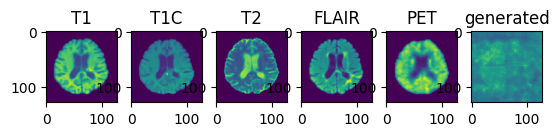

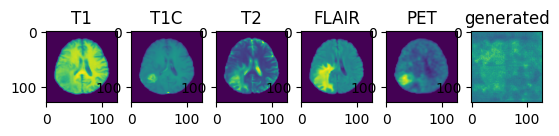

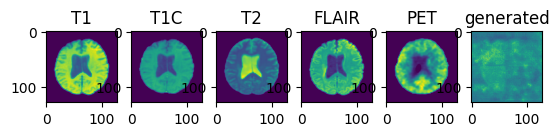

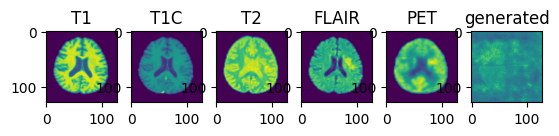

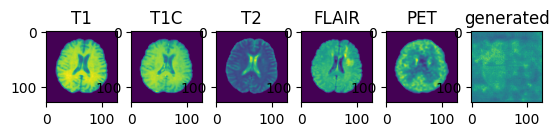

validation avg MS-SSIM: 0.1349 , train avg MS-SSIM: 0.1388
----------
epoch 41/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:35, 90.48s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:34, 39.47s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:28, 23.13s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.36s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.99s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:50,  8.35s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:34,  6.84s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.88s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.11s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.60s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.19s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.94s/it]

----------
epoch 42/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:36, 90.61s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:35, 39.53s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:28, 23.19s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.97s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.33s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.71s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:14,  4.96s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.59s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.91s/it]

----------
epoch 43/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:30, 90.08s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:31, 39.13s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.76s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.18s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.31s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.76s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:23,  5.79s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:00<00:08,  4.48s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.90s/it]

----------
epoch 44/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:33, 90.29s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:31, 39.14s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:26, 22.97s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.31s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.66s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:22,  5.59s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:14,  4.96s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.59s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.39s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 11.00s/it]

----------
epoch 45/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:34, 90.38s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:33, 39.32s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:25, 22.88s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.14s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.94s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:51,  8.55s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:34,  6.82s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.69s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:57<00:14,  5.00s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:09,  4.56s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.17s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.56s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.93s/it]

----------
epoch 46/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:46, 91.52s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:38, 39.81s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:28, 23.17s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:17, 11.11s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.44s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.74s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:22,  5.67s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.02s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.65s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.04s/it]

----------
epoch 47/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<17:02, 92.95s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:42, 40.22s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:31, 23.53s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:43<02:05, 15.64s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:19, 11.35s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:50<00:51,  8.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:53<00:34,  6.86s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:57<00:23,  5.78s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:15,  5.04s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:08,  4.49s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.60s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.15s/it]

----------
epoch 48/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:09, 93.60s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:47, 40.70s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:32, 23.62s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:05, 15.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:18, 11.26s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:50<00:51,  8.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:54<00:34,  6.83s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:57<00:22,  5.69s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:15,  5.00s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:04<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.16s/it]

----------
epoch 49/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<16:54, 92.21s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:40, 40.04s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:29, 23.24s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:04, 15.52s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:18, 11.17s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:51,  8.57s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:53<00:35,  7.01s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:23,  5.89s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:15,  5.11s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.55s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.18s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.07s/it]

----------
epoch 50/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:03, 93.04s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:42, 40.25s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:30, 23.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.42s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:17, 11.04s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:50,  8.42s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.73s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:23,  5.77s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:15,  5.14s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.57s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.13s/it]

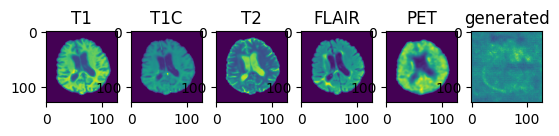

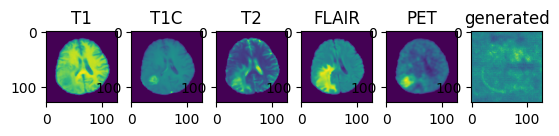

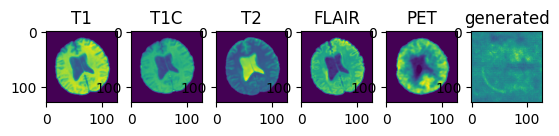

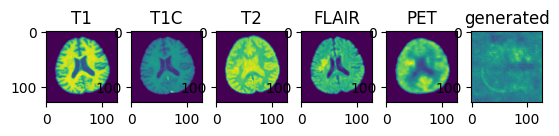

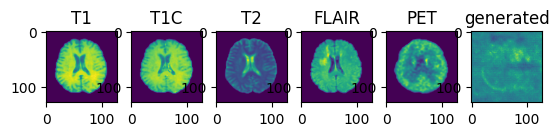

validation avg MS-SSIM: 0.1187 , train avg MS-SSIM: 0.1142
----------
epoch 51/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:29, 89.92s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:30, 39.02s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:26, 22.95s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<02:01, 15.21s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.96s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:50,  8.49s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:34,  6.94s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.95s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.13s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.69s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.97s/it]

----------
epoch 52/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:49, 91.82s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:39, 39.94s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:29, 23.26s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:02, 15.36s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:16, 11.00s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.43s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:34,  6.86s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:22,  5.74s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.09s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.61s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.44s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.73s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.12s/it]

----------
epoch 53/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:17, 88.90s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:24, 38.49s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.43s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 14.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:15, 10.77s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:49,  8.26s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:34,  6.80s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.67s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:14,  4.99s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.50s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.80s/it]

----------
epoch 54/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:36, 90.63s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:34, 39.43s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:26, 22.96s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.29s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:16, 10.94s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:47<00:49,  8.32s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:51<00:33,  6.80s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:54<00:22,  5.66s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:08,  4.48s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:04<00:04,  4.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.94s/it]

----------
epoch 55/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:07, 87.98s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:21, 38.17s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:19, 22.20s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.70s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:49,  8.18s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:33,  6.79s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.69s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.94s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.40s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.08s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.49s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00, 10.67s/it]

----------
epoch 56/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:36<17:45, 96.87s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:40<06:58, 41.84s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:43<03:39, 24.38s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:47<02:08, 16.04s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:50<01:21, 11.60s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:54<00:52,  8.83s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:57<00:35,  7.02s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [02:00<00:23,  5.84s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:04<00:15,  5.03s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:07<00:09,  4.52s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:10<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00,  3.77s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:18<00:00, 11.54s/it]

----------
epoch 57/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:30, 90.06s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:33, 39.31s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:27, 23.05s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.33s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:17, 11.14s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:51,  8.63s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:34,  6.97s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:24,  6.07s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.21s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.63s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.59s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.07s/it]

----------
epoch 58/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:45, 91.41s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:37, 39.77s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:29, 23.31s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.46s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:18, 11.21s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:52,  8.70s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:53<00:35,  7.05s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:23,  5.92s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:00<00:15,  5.12s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.59s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.60s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00, 11.14s/it]

----------
epoch 59/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:36<17:36, 96.05s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:39<06:56, 41.63s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:43<03:38, 24.24s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:46<02:08, 16.06s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:49<01:20, 11.45s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:53<00:52,  8.79s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:57<00:35,  7.10s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [02:00<00:23,  5.96s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:03<00:15,  5.13s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:07<00:09,  4.65s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:10<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:13<00:00,  3.61s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:17<00:00, 11.43s/it]

----------
epoch 60/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:49, 91.77s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:39, 39.97s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:28, 23.18s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.46s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:17, 11.07s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.77s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.77s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.07s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.60s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:06<00:04,  4.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.06s/it]

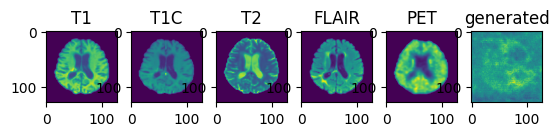

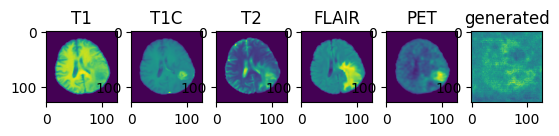

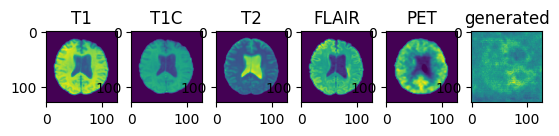

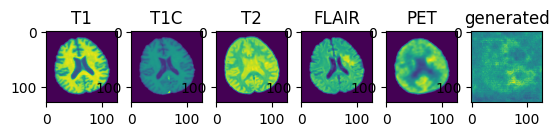

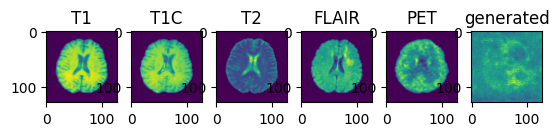

validation avg MS-SSIM: 0.1654 , train avg MS-SSIM: 0.1604
----------
epoch 61/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:43, 91.20s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:38, 39.90s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:29, 23.25s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:45<01:17, 11.10s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:50,  8.47s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.78s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:22,  5.67s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:14,  4.91s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.51s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.13s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.57s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.03s/it]

----------
epoch 62/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:31<16:43, 91.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:34<06:36, 39.62s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:38<03:27, 23.08s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:41<02:02, 15.31s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:44<01:17, 11.02s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:48<00:51,  8.61s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:34,  6.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:23,  5.85s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:15,  5.05s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:09,  4.50s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:04,  4.16s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:12<00:00, 11.03s/it]

----------
epoch 63/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:05, 93.23s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:44, 40.48s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:33, 23.67s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:06, 15.80s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:20, 11.45s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:52,  8.69s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:54<00:34,  6.91s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:57<00:22,  5.74s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:01<00:15,  5.01s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:04<00:08,  4.49s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:08<00:04,  4.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00,  3.70s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.22s/it]

----------
epoch 64/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<16:58, 92.62s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:35<06:40, 40.08s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:29, 23.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.47s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:17, 11.11s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:51,  8.61s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:53<00:34,  6.87s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:22,  5.73s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:14,  4.99s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:03<00:09,  4.56s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:07<00:04,  4.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00,  3.66s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.17s/it]

----------
epoch 65/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:34<17:14, 94.04s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:37<06:47, 40.78s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:32, 23.66s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:44<02:04, 15.62s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:47<01:19, 11.30s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:52,  8.69s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:55<00:35,  7.05s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:58<00:23,  5.88s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:01<00:15,  5.07s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:05<00:09,  4.60s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:08<00:04,  4.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00,  3.55s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.21s/it]

----------
epoch 66/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<15:57, 87.04s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:17, 37.78s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:57, 14.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.56s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.55s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.52s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.83s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.37s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.03s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.48s/it]

----------
epoch 67/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:01, 87.41s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.91s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:19, 22.12s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.54s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.61s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.88s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.39s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.03s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 68/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:01, 87.36s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.93s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.27s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.77s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.62s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.13s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.53s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.51s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.80s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.32s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.48s/it]

----------
epoch 69/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<15:59, 87.23s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.83s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.06s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.62s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.12s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:33,  6.64s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.57s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.85s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.37s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.01s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.44s/it]

----------
epoch 70/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:52, 86.61s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:15, 37.59s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:19, 22.13s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:57, 14.70s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.61s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.12s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.53s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.49s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.81s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.33s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.45s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.52s/it]

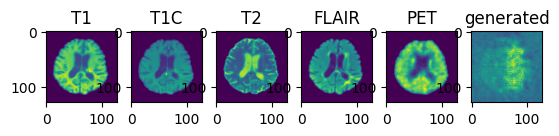

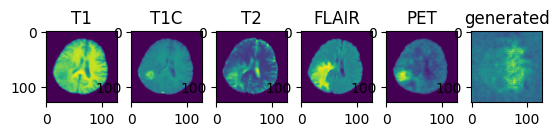

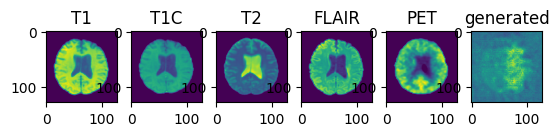

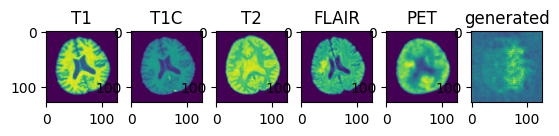

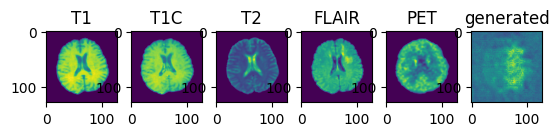

validation avg MS-SSIM: 0.1980 , train avg MS-SSIM: 0.1883
----------
epoch 71/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:00, 87.33s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.88s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:21, 22.41s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:59, 14.88s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.69s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.16s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.57s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.52s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.82s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.34s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.53s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.61s/it]

----------
epoch 72/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:35<17:28, 95.27s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:38<06:51, 41.16s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:41<03:34, 23.87s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:45<02:05, 15.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:48<01:18, 11.26s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:51<00:51,  8.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:55<00:34,  6.86s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:58<00:23,  5.87s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [02:02<00:15,  5.05s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:05<00:09,  4.50s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:08<00:04,  4.14s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00,  3.51s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:14<00:00, 11.22s/it]

----------
epoch 73/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:53, 86.70s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:16, 37.62s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.11s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:57, 14.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.57s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.07s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.51s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.48s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.79s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.32s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.12s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.51s/it]

----------
epoch 74/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:51, 86.51s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:15, 37.56s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:17, 21.90s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:56, 14.55s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:13, 10.52s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.06s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:33,  6.65s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:22,  5.61s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.89s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.42s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.10s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.53s/it]

----------
epoch 75/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:07, 87.95s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:21, 38.17s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:21, 22.41s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.69s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.16s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.56s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.50s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.81s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.35s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.63s/it]

----------
epoch 76/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:12, 88.38s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.37s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.84s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.67s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.16s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:33,  6.71s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.61s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.90s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.40s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.05s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.46s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.63s/it]

----------
epoch 77/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:06, 87.85s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.32s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.33s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.80s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.64s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.15s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.55s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.53s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.83s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.44s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.42s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.55s/it]

----------
epoch 78/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:08, 88.01s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:21, 38.16s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:19, 22.21s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.77s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:15, 10.75s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:49,  8.22s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:33,  6.60s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:22,  5.55s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.84s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.36s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.60s/it]

----------
epoch 79/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:21, 89.21s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:27, 38.72s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:23, 22.56s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 14.98s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:15, 10.77s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:49,  8.27s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:33,  6.66s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.59s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.85s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.45s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:02<00:04,  4.07s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00,  3.45s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00, 10.73s/it]

----------
epoch 80/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:29, 89.96s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:29, 39.00s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.68s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<02:00, 15.01s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:16, 10.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:49,  8.32s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:50<00:33,  6.68s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:53<00:22,  5.60s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:14,  4.87s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.41s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:03<00:04,  4.09s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  3.48s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:09<00:00, 10.81s/it]

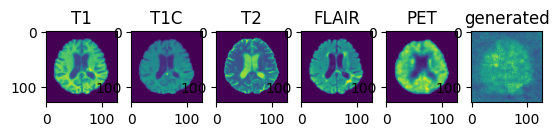

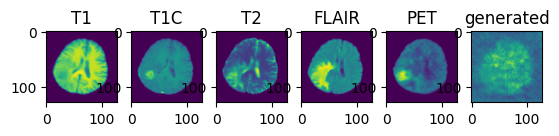

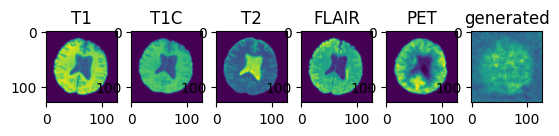

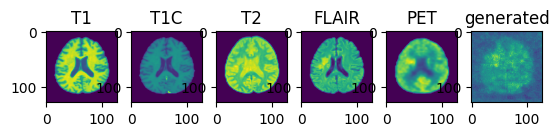

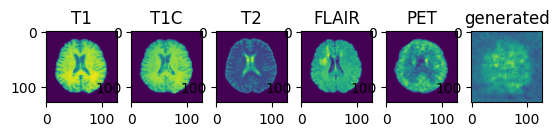

validation avg MS-SSIM: 0.2795 , train avg MS-SSIM: 0.2756
----------
epoch 81/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:22, 89.27s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:26, 38.65s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:24, 22.67s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 14.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:15, 10.74s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:49,  8.18s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.55s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:21,  5.50s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.78s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.29s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:02<00:04,  4.06s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00,  3.44s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.62s/it]

----------
epoch 82/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:50, 86.38s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:14, 37.50s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.84s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.50s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.42s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.97s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.55s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.50s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.78s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.29s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.97s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.37s/it]

----------
epoch 83/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:37, 85.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:09, 36.99s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:15, 21.70s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:54, 14.36s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.31s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.87s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.32s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.32s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.24s/it]

----------
epoch 84/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:17, 88.83s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:24, 38.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.60s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.08s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.59s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.49s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.75s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.25s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.93s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 85/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:33<17:06, 93.28s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:43, 40.32s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:40<03:32, 23.56s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:43<02:04, 15.52s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:17, 11.08s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:50,  8.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.70s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:56<00:22,  5.57s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:59<00:14,  4.81s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:02<00:08,  4.30s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.47s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:11<00:00, 10.93s/it]

----------
epoch 86/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:35, 85.05s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:09, 36.91s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.30s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:12, 10.30s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.89s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:32,  6.49s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.44s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.74s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.27s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 87/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:28, 84.45s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:06, 36.67s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.28s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.27s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.86s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.32s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.14s/it]

----------
epoch 88/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:30, 84.62s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:06, 36.67s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:12, 21.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.16s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.19s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:46,  7.79s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.38s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.34s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.14s/it]

----------
epoch 89/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:53, 81.23s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.50s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.70s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:50, 13.76s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.20s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 90/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:52, 81.10s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.31s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.61s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.71s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:10, 10.00s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.66s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

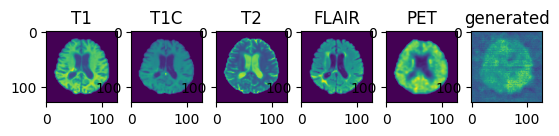

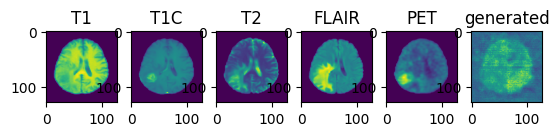

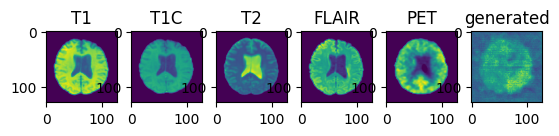

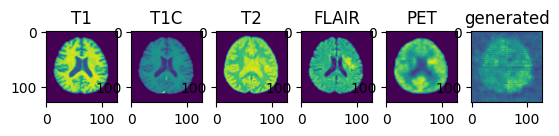

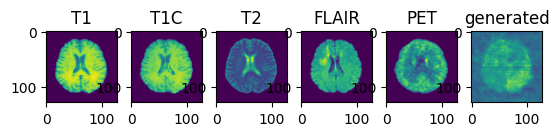

validation avg MS-SSIM: 0.3139 , train avg MS-SSIM: 0.3079
----------
epoch 91/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:56, 81.47s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.39s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.65s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.89s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.71s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.20s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.57s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 92/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:02, 82.08s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:58, 35.81s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.89s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.99s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.17s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 93/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:47, 80.69s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:50, 35.08s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:04, 20.50s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.66s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.87s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.58s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.13s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.20s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.58s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 94/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:50, 86.39s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:14, 37.43s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.78s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:55, 14.43s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.37s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.91s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.36s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.34s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.73s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 95/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:59, 81.74s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:55, 35.55s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:51, 13.95s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:10, 10.06s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.71s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.22s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 96/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<15:58, 87.12s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:17, 37.72s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:17, 21.94s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:56, 14.53s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:13, 10.44s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.96s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:31,  6.39s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.80s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.31s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.36s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.38s/it]

----------
epoch 97/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:08, 82.59s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:58, 35.88s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:08, 20.95s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.91s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:11, 10.15s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.77s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.26s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 98/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:44, 80.43s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:49, 34.98s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.46s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:49, 13.64s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.86s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.58s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 99/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.79s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:51, 35.11s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:04, 20.51s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:08,  9.85s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.57s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.12s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.16s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.09s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 100/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:51, 81.01s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:51, 35.20s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.56s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.87s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.57s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.12s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

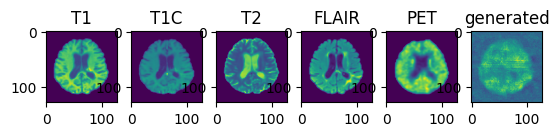

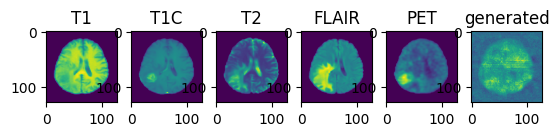

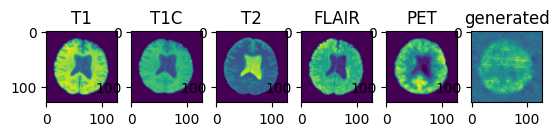

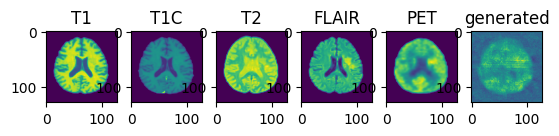

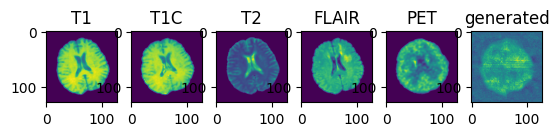

validation avg MS-SSIM: 0.3588 , train avg MS-SSIM: 0.3552
----------
epoch 101/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.73s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:50, 35.07s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.66s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.90s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.59s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.13s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.10s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 102/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:58, 81.64s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.69s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.72s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.22s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.23s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.58s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 103/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:43, 80.28s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:51, 35.10s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.51s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.87s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.59s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.13s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 104/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:35, 79.56s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:46, 34.60s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:02, 20.23s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:09,  9.89s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.60s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 105/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:57, 81.57s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.42s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.68s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.75s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

----------
epoch 106/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:20, 83.72s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:03, 36.36s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:10, 21.19s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.20s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.21s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.81s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.29s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 107/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:20, 83.64s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:02, 36.29s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:10, 21.15s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:10, 10.11s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.74s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.34s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.32s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.03s/it]

----------
epoch 108/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:57, 81.63s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.84s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.85s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.98s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.21s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 109/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:30, 79.13s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:44, 34.43s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:01, 20.15s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.43s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.72s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.59s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 110/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:42, 80.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.40s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.58s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.80s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.15s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.61s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

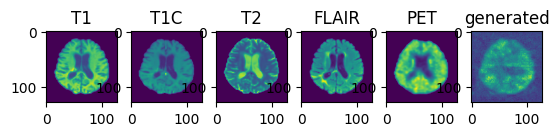

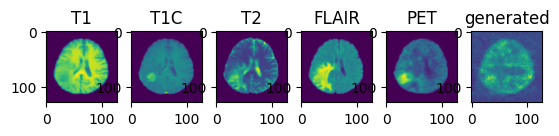

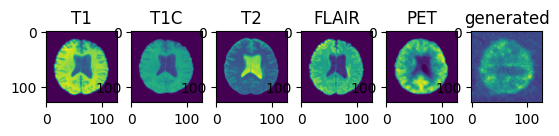

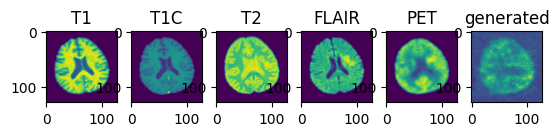

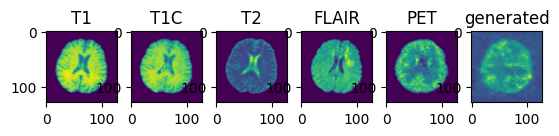

validation avg MS-SSIM: 0.3743 , train avg MS-SSIM: 0.3762
----------
epoch 111/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:03, 82.10s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:56, 35.64s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.79s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.95s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.66s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.20s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.34s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:15,  5.03s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:10,  5.47s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:05,  5.68s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00,  4.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.64s/it]

----------
epoch 112/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:10, 82.74s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:59, 35.90s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:08, 20.94s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.91s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.02s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.79s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.26s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.26s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 113/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:36, 79.67s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:46, 34.66s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:02, 20.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.53s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.82s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.11s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.18s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 114/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:23, 83.95s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:04, 36.41s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:52, 14.10s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.15s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.88s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.33s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.32s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.64s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 115/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:35, 79.58s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.86s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.42s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:49, 13.66s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:09,  9.88s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.60s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.22s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 116/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:46, 80.59s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:50, 35.04s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.48s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:48, 13.62s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:08,  9.83s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.67s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.58s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 117/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.42s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:59, 35.99s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:08, 20.98s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.03s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.68s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.20s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 118/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:58, 81.66s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:55, 35.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.77s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:10, 10.08s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.72s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.23s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.26s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 119/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:54, 81.36s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.35s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.63s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.91s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.61s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 120/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<15:00, 81.89s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:55, 35.58s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.78s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.83s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:10, 10.12s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.76s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.25s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

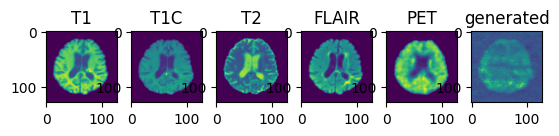

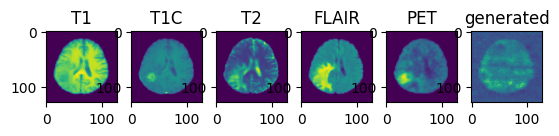

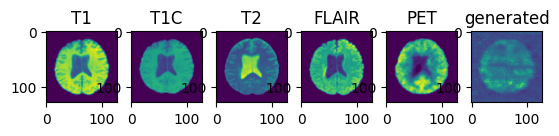

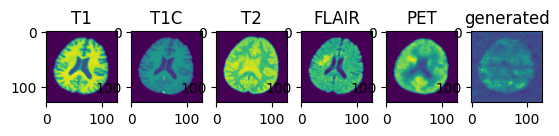

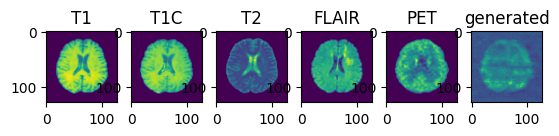

validation avg MS-SSIM: 0.3365 , train avg MS-SSIM: 0.3377
----------
epoch 121/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:51, 81.02s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:52, 35.22s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.59s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.71s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.91s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.74s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.25s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.26s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

----------
epoch 122/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:57, 81.62s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:56, 35.68s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.83s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.84s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09, 10.00s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.66s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.19s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 123/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:59, 81.79s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:55, 35.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.73s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.94s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:46,  7.73s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.23s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.24s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.57s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 124/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:11, 82.86s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:59, 35.95s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:08, 20.97s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.03s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.68s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.19s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.21s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 125/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:14, 83.16s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:00, 36.09s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.05s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.21s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.80s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.28s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00, 10.00s/it]

----------
epoch 126/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.73s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:50, 35.08s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.50s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:08,  9.85s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.56s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.12s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.61s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 127/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:37, 79.76s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:46, 34.70s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:02, 20.28s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:49, 13.66s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:09,  9.86s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.57s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.12s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.16s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.52s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.10s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 128/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:44, 80.43s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:50, 35.00s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.49s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.89s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.61s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.17s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.25s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 129/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:12, 88.37s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:22, 38.28s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.27s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.65s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.49s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.44s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.22s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.36s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 130/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:32, 79.31s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:45, 34.51s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:01, 20.17s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.44s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.72s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.47s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.05s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.61s/it]

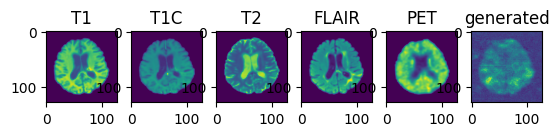

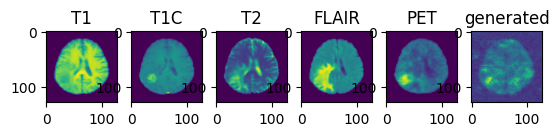

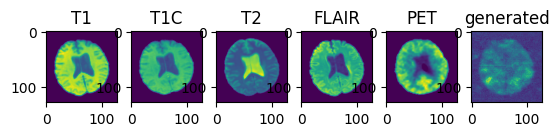

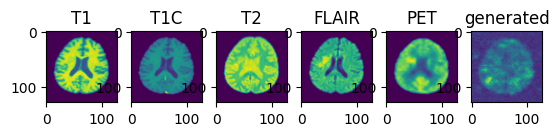

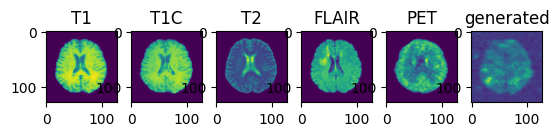

validation avg MS-SSIM: 0.3574 , train avg MS-SSIM: 0.3513
----------
epoch 131/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:41, 80.18s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.86s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.38s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.57s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.80s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.53s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:31,  6.21s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.23s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 132/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.80s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.33s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.16s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.20s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.22s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 133/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:12, 82.97s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<05:59, 36.00s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:08, 20.99s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.94s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.03s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.67s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.30s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 134/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.80s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.31s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.90s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.60s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.18s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 135/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:15, 83.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:01, 36.11s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.98s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.18s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.78s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.25s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 136/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:41, 80.17s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.84s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.55s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.79s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.53s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:21,  5.26s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 137/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:35, 79.55s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:46, 34.61s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:02, 20.23s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.62s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.84s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.56s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.13s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 138/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:48, 80.81s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:51, 35.13s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:04, 20.51s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.66s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:08,  9.86s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.57s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.11s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

----------
epoch 139/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:33, 79.38s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:45, 34.54s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:01, 20.21s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.59s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.82s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.56s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.10s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.15s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.51s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.08s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 140/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:54, 81.32s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.34s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.75s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.95s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.31s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

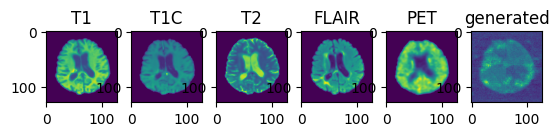

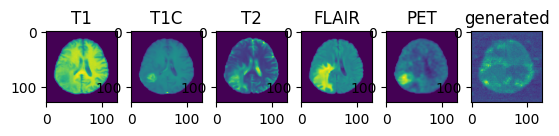

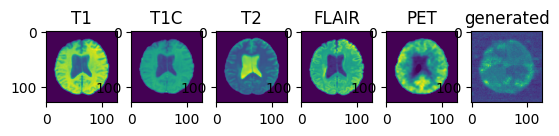

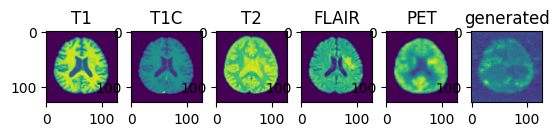

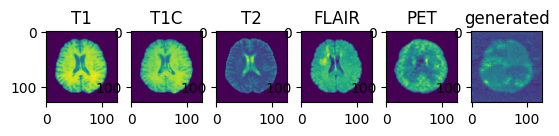

validation avg MS-SSIM: 0.3664 , train avg MS-SSIM: 0.3670
----------
epoch 141/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:53, 81.21s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:52, 35.29s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.60s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.69s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.89s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.58s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.23s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.23s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

----------
epoch 142/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:42, 80.23s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.50s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:49, 13.64s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.83s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.55s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.10s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.14s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.07s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 143/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:41, 80.12s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.56s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.80s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.52s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.20s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 144/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:19, 78.18s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:42, 34.22s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<03:00, 20.02s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:46, 13.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.67s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.44s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.02s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.09s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.47s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.05s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 145/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:34, 79.49s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:45, 34.57s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:01, 20.20s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.45s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.72s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:44,  7.47s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.18s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.10s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.66s/it]

----------
epoch 146/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:05, 82.33s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:57, 35.76s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.06s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.09s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.73s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.24s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 147/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:39, 79.92s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:47, 34.74s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:02, 20.31s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.52s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.76s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:44,  7.49s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.17s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.09s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 148/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:54, 81.35s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:55, 35.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.71s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:50, 13.76s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.61s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.52s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.83s/it]

----------
epoch 149/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:26, 78.82s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:42, 34.28s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:00, 20.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:46, 13.37s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.67s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:45,  7.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.14s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.49s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.06s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 150/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:27, 78.88s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:43, 34.32s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:00, 20.09s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.39s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.68s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.45s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.03s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.11s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.49s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.06s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

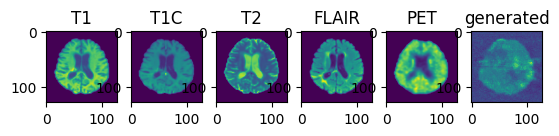

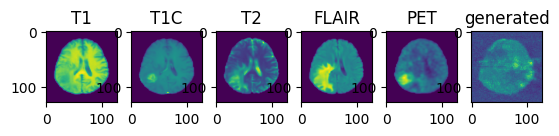

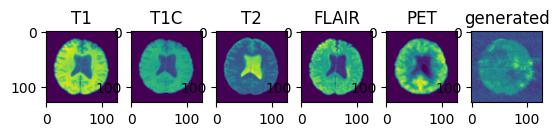

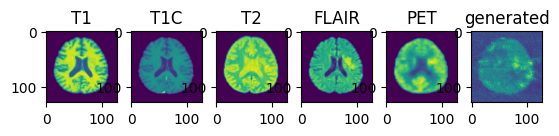

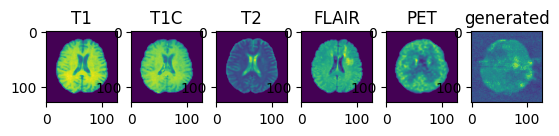

validation avg MS-SSIM: 0.3601 , train avg MS-SSIM: 0.3603
----------
epoch 151/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:54, 81.29s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:52, 35.30s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.60s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.70s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.89s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.59s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.13s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 152/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:56, 81.47s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.40s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.68s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:50, 13.76s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:12, 10.36s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:52,  8.72s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:37,  7.55s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:26,  6.63s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:16,  5.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:09,  4.88s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:02<00:04,  4.96s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  4.37s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00, 10.73s/it]

----------
epoch 153/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:58, 81.67s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:55, 35.51s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.80s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.95s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.63s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.16s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.20s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 154/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:13, 77.62s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:20<05:38, 33.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:23<02:58, 19.82s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:45, 13.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.41s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:30,  6.12s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.17s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.10s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.51s/it]

----------
epoch 155/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<15:00, 81.84s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:55, 35.58s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.74s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.93s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.18s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 156/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:25, 78.64s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:42, 34.23s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<03:00, 20.03s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:46, 13.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.78s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:45,  7.51s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.08s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.13s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.08s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.64s/it]

----------
epoch 157/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:53, 81.20s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:53, 35.32s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.63s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.92s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.16s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.20s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:49<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 158/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:41, 80.15s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.36s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.55s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.93s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.15s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

----------
epoch 159/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:38, 79.84s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:47, 34.71s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:02, 20.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.51s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.76s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:44,  7.49s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.07s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.12s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.57s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.71s/it]

----------
epoch 160/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:05, 82.29s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:57, 35.73s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.83s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.85s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.11s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.73s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.22s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.23s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.57s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

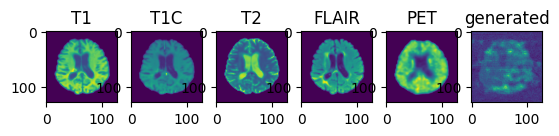

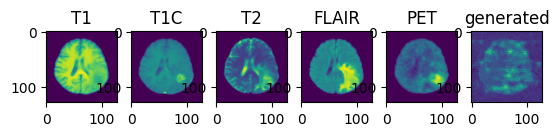

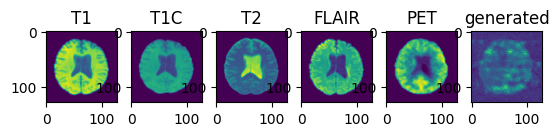

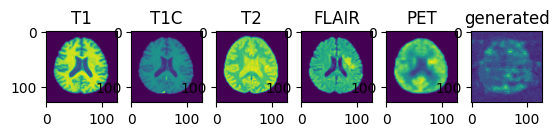

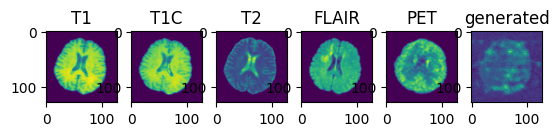

validation avg MS-SSIM: 0.2825 , train avg MS-SSIM: 0.2828
----------
epoch 161/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.43s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.85s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.99s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.18s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 162/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:16, 83.35s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:01, 36.19s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.10s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:52, 14.02s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.22s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.81s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.05s/it]

----------
epoch 163/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:56, 81.53s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.46s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.71s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.96s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.64s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.17s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:21,  5.29s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 164/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:24, 84.02s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:04, 36.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.25s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.22s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:46,  7.81s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.28s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.61s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

----------
epoch 165/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:30, 84.55s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:06, 36.69s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:12, 21.38s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.20s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:46,  7.82s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:32,  6.41s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:14,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 166/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:07, 87.95s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:20, 38.06s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.54s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.02s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.43s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.38s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.69s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.47s/it]

----------
epoch 167/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:57, 81.63s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.46s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:06, 20.71s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.78s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.95s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.63s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.29s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 168/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:07, 82.49s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:00, 36.04s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.02s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.98s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.09s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.73s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.23s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.61s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

----------
epoch 169/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.37s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:57, 35.75s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.86s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:10, 10.01s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.67s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.30s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.29s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 170/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:33, 79.38s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:47, 34.76s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:02, 20.32s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:48, 13.53s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.79s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:45,  7.53s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.15s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.53s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.34s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.96s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

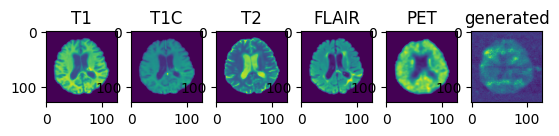

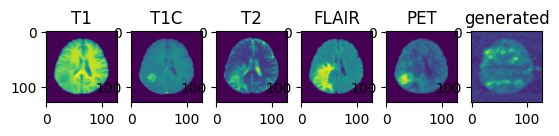

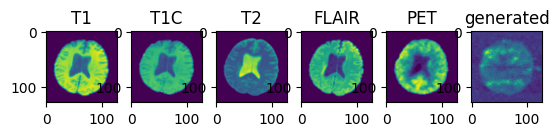

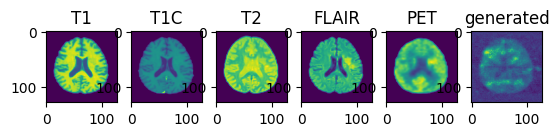

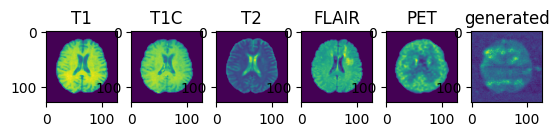

validation avg MS-SSIM: 0.3694 , train avg MS-SSIM: 0.3647
----------
epoch 171/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:43, 80.27s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:03, 20.39s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.91s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.60s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.14s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.80s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 172/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:58, 81.64s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:54, 35.48s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:06, 20.74s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.79s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.96s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:31,  6.23s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 173/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.45s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:58, 35.80s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.97s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.06s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.72s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.22s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.24s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.58s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 174/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:26, 84.22s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:05, 36.53s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.13s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.17s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.78s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.38s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

----------
epoch 175/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:21<14:53, 81.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:52, 35.29s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:07, 20.82s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.84s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.98s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.66s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:40<00:30,  6.19s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:43<00:20,  5.23s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:46<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 176/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:55, 86.82s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:16, 37.60s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:16, 21.87s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.40s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.93s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.36s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.45s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.74s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.26s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.93s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.34s/it]

----------
epoch 177/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:03, 87.55s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.92s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.06s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:58, 14.76s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:14, 10.58s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.05s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.45s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.40s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.43s/it]

----------
epoch 178/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:25, 84.14s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:05, 36.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.15s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.19s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:46,  7.81s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.40s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.12s/it]

----------
epoch 179/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:32<17:02, 92.97s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:36<06:41, 40.15s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:39<03:29, 23.25s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:42<02:03, 15.50s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:46<01:17, 11.09s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:49<00:50,  8.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:52<00:33,  6.69s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:55<00:22,  5.57s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:58<00:14,  4.82s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [02:01<00:08,  4.30s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:05<00:03,  3.97s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.37s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.91s/it]

----------
epoch 180/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:23, 83.93s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:04, 36.45s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.27s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:52, 14.12s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.17s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.80s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.28s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.40s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:14,  4.70s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.23s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.10s/it]

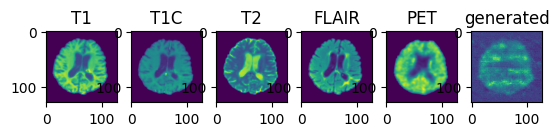

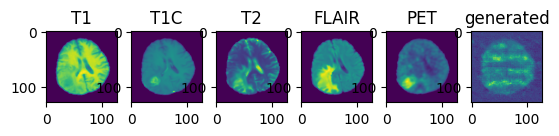

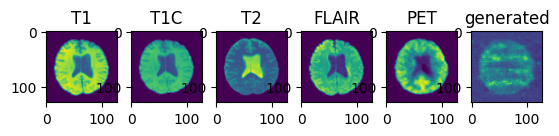

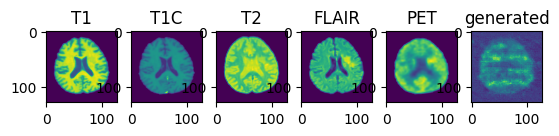

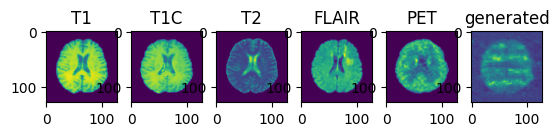

validation avg MS-SSIM: 0.3841 , train avg MS-SSIM: 0.3830
----------
epoch 181/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:38, 85.28s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:09, 36.98s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.28s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.27s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.85s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.33s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.48s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.76s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.27s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

----------
epoch 182/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:35, 85.05s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:08, 36.86s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:53, 14.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:12, 10.36s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.91s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.35s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.19s/it]

----------
epoch 183/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.42s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:58, 35.85s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:08, 20.92s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:51, 13.90s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.04s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.74s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.25s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:14,  4.70s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.33s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 184/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:20, 83.71s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:03, 36.34s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:10, 21.17s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.20s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.22s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.82s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.30s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 185/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:00, 87.28s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.84s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.02s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:56, 14.58s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.45s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:47,  7.97s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:31,  6.39s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.39s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.70s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.37s/it]

----------
epoch 186/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:30, 84.61s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:07, 36.73s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:12, 21.40s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.34s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:12, 10.31s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.88s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.34s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:14,  4.68s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.22s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.16s/it]

----------
epoch 187/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:16, 83.34s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:01, 36.15s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.08s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:52, 14.04s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:10, 10.12s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.76s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.26s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.23s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 188/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:15, 83.25s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:01, 36.12s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.07s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:11, 10.20s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.80s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.27s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.27s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.15s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 189/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:13, 83.01s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:00, 36.02s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.00s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:51, 13.94s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.04s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.69s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.19s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.64s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 190/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:11, 82.88s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<05:59, 35.99s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:29<03:09, 21.02s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:32<01:53, 14.13s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:11, 10.18s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.79s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.30s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:48<00:13,  4.64s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

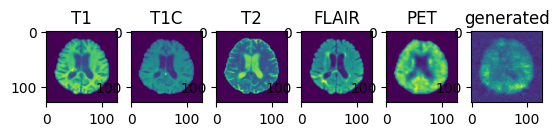

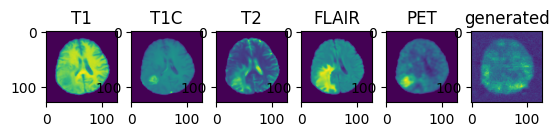

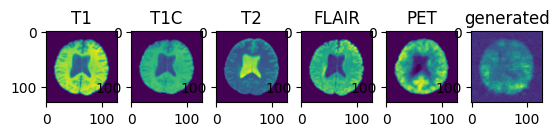

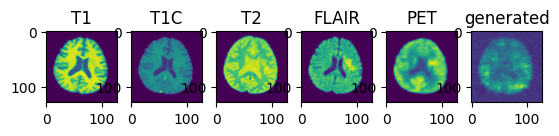

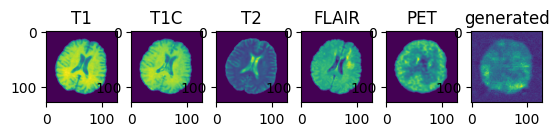

validation avg MS-SSIM: 0.4271 , train avg MS-SSIM: 0.4296
----------
epoch 191/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:46, 86.03s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:12, 37.27s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.87s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:55, 14.48s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.39s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.92s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.36s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:13,  4.64s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 192/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:06, 82.41s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.88s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.99s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:45,  7.65s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.17s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 193/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:04, 87.65s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.96s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.05s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.75s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.56s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.03s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.42s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.35s/it]

----------
epoch 194/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:00, 87.34s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.81s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:17, 21.95s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:56, 14.50s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.39s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.90s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.44s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.38s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.28s/it]

----------
epoch 195/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:01, 87.39s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:18, 37.80s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:19, 22.12s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:56, 14.61s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.45s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:47,  7.95s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:31,  6.36s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.32s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.29s/it]

----------
epoch 196/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:38, 85.34s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:10, 37.02s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.55s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.28s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.26s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.83s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.39s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:14,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.16s/it]

----------
epoch 197/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:06, 87.89s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:20, 38.04s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.27s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.54s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.03s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.44s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.38s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:04,  4.11s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.43s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.43s/it]

----------
epoch 198/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:20, 89.12s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:25, 38.58s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.42s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.81s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.06s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.56s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.46s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.74s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 199/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:50, 86.42s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:13, 37.40s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.80s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:55, 14.46s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.38s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.92s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.36s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.34s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.40s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.28s/it]

----------
epoch 200/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:41, 85.55s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:10, 37.09s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:14, 21.60s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.29s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.85s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.31s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.41s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.69s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.18s/it]

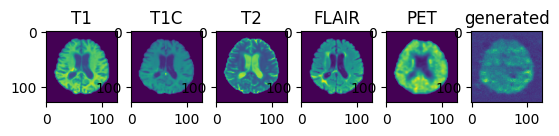

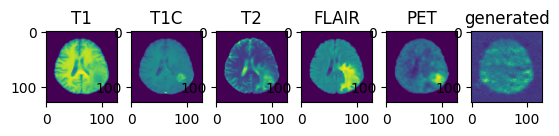

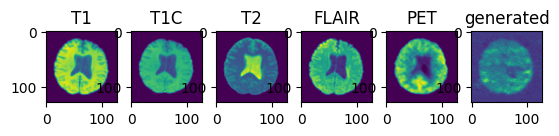

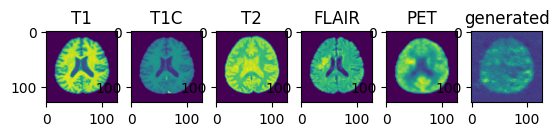

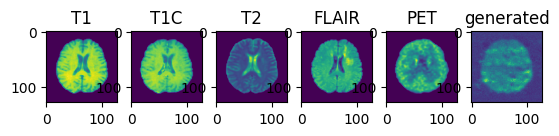

validation avg MS-SSIM: 0.4115 , train avg MS-SSIM: 0.4108
----------
epoch 201/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:17, 88.85s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:24, 38.41s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:20, 22.29s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:57, 14.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:13, 10.53s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.01s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.40s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.36s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.75s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.25s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.43s/it]

----------
epoch 202/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:27, 89.81s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:27, 38.79s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.49s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:58, 14.83s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:14, 10.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:48,  8.15s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.49s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.41s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.68s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.48s/it]

----------
epoch 203/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:19, 89.02s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:24, 38.48s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:20, 22.33s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:57, 14.73s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:13, 10.54s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.00s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:31,  6.40s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.40s/it]

----------
epoch 204/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:54, 86.77s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:15, 37.56s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.83s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.45s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:13, 10.50s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  8.00s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:32,  6.41s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.36s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 205/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:24, 89.48s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:26, 38.69s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.44s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.82s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.61s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:48,  8.08s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.46s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.41s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.69s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 206/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:14, 88.62s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:23, 38.36s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:20, 22.28s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:57, 14.72s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:14, 10.67s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.48s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.42s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.22s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.44s/it]

----------
epoch 207/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:07, 82.53s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:58, 35.84s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:08, 20.89s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:51, 13.89s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:35<01:10, 10.02s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:38<00:46,  7.68s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:30,  6.20s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:20,  5.22s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:51<00:08,  4.20s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:54<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 208/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:37, 85.21s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:09, 36.91s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.25s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.39s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.93s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.37s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 209/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:04, 87.66s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.96s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.06s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:56, 14.59s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.46s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:47,  7.97s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:31,  6.39s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.31s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.95s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.37s/it]

----------
epoch 210/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:51, 86.52s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:15, 21.77s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:55, 14.40s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.31s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.97s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.37s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.32s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

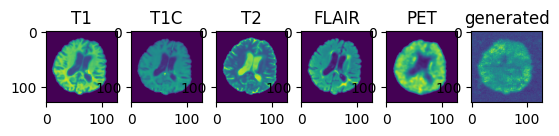

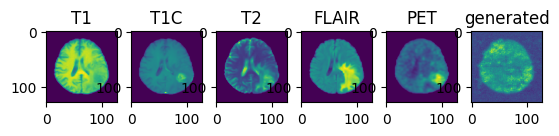

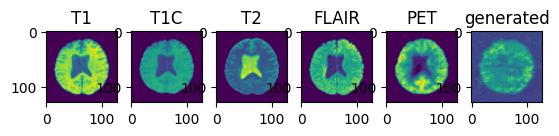

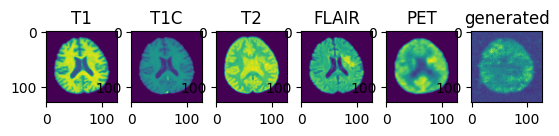

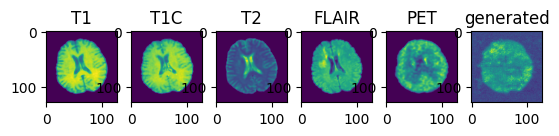

validation avg MS-SSIM: 0.4381 , train avg MS-SSIM: 0.4386
----------
epoch 211/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:56, 86.92s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:16, 37.62s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:16, 21.86s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.46s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.37s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:48,  8.03s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:32,  6.42s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.27s/it]

----------
epoch 212/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:38, 85.31s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:11, 37.19s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:14, 21.64s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:54, 14.34s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.29s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.86s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.32s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.31s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.63s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.97s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.19s/it]

----------
epoch 213/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:55, 86.83s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:15, 37.59s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:16, 21.85s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.47s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.39s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.92s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:33,  6.64s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:22,  5.52s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:14,  4.78s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.27s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.37s/it]

----------
epoch 214/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:28<16:12, 88.39s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:31<06:22, 38.23s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:34<03:19, 22.19s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:57, 14.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.52s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.01s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:47<00:32,  6.41s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:50<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:53<00:14,  4.68s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:56<00:08,  4.31s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.94s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.40s/it]

----------
epoch 215/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:04, 87.70s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:19, 37.94s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.03s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:56, 14.56s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:12, 10.42s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.04s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.43s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.38s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.25s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.32s/it]

----------
epoch 216/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<16:01, 87.44s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:20, 38.03s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.07s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:37<01:56, 14.57s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:40<01:13, 10.45s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:47,  7.96s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:31,  6.38s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.34s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:59<00:03,  3.92s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.32s/it]

----------
epoch 217/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:45, 85.99s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:12, 37.25s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:54, 14.36s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.31s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.86s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.32s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.41s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:14,  4.70s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.87s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

----------
epoch 218/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:36, 85.10s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:08, 36.87s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.45s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:54, 14.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:12, 10.29s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.86s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.29s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.60s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.14s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.34s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.12s/it]

----------
epoch 219/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:39, 90.83s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:32, 39.23s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:37<03:24, 22.75s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:40<01:59, 14.99s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:43<01:14, 10.70s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:46<00:48,  8.11s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:49<00:32,  6.47s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.52s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:56<00:14,  4.77s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:59<00:08,  4.25s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:02<00:03,  3.90s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.57s/it]

----------
epoch 220/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:26<15:56, 86.92s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:16, 37.62s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:18, 22.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:56, 14.55s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:13, 10.43s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:42<00:47,  7.95s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.37s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.33s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.64s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.18s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.35s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.30s/it]

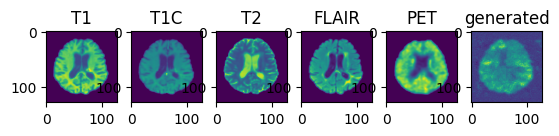

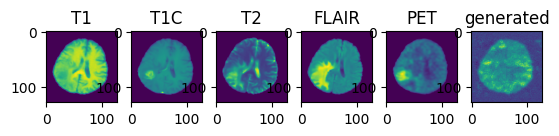

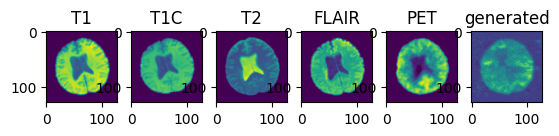

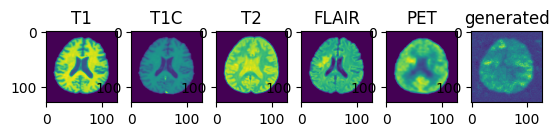

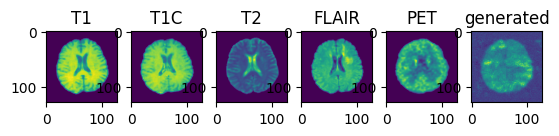

validation avg MS-SSIM: 0.4366 , train avg MS-SSIM: 0.4353
----------
epoch 221/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:27<15:57, 87.08s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:30<06:17, 37.70s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:33<03:17, 21.90s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:36<01:55, 14.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:39<01:12, 10.38s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:43<00:48,  8.04s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:46<00:32,  6.43s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:49<00:21,  5.36s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:52<00:13,  4.65s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:55<00:08,  4.17s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:58<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.29s/it]

----------
epoch 222/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:30<16:31, 90.16s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:33<06:29, 38.94s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:36<03:23, 22.57s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:59, 14.88s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:14, 10.65s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:48,  8.10s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.46s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.39s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.77s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.27s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.53s/it]

----------
epoch 223/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:19, 89.09s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:25, 38.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:21, 22.35s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:57, 14.74s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:41<01:13, 10.54s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:44<00:48,  8.14s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.49s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.42s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.69s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.21s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:00<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.46s/it]

----------
epoch 224/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:20, 89.12s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:27, 38.77s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.51s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:38<01:58, 14.86s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:14, 10.63s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:48,  8.09s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.48s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:51<00:21,  5.43s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:54<00:14,  4.73s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:57<00:08,  4.25s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:04,  4.02s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.39s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.51s/it]

----------
epoch 225/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:35, 85.03s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:08, 36.87s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:53, 14.22s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.23s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.83s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:32,  6.43s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.37s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:14,  4.67s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.28s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 226/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:25<15:44, 85.84s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:29<06:12, 37.22s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:32<03:16, 21.83s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:35<01:55, 14.45s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:38<01:12, 10.36s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.90s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:45<00:31,  6.34s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:48<00:21,  5.31s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:51<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:54<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:57<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.38s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

----------
epoch 227/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:29<16:25, 89.61s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:32<06:27, 38.78s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:35<03:22, 22.51s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:39<01:58, 14.87s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:42<01:14, 10.65s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:45<00:48,  8.10s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:48<00:32,  6.48s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:52<00:22,  5.54s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:55<00:14,  4.79s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:58<00:08,  4.27s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [02:01<00:03,  3.93s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.32s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:06<00:00, 10.53s/it]

----------
epoch 228/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:26, 84.26s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:27<06:05, 36.59s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:11, 21.32s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:53, 14.13s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:12, 10.29s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:40<00:47,  7.86s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:43<00:31,  6.32s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:46<00:21,  5.30s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:13,  4.62s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.16s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.85s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.08s/it]

----------
epoch 229/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:23<15:20, 83.71s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:26<06:03, 36.34s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:30<03:10, 21.19s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:33<01:52, 14.07s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:36<01:10, 10.14s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:39<00:46,  7.77s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:42<00:31,  6.27s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:45<00:21,  5.28s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:49<00:14,  4.71s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:52<00:08,  4.24s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:55<00:03,  3.91s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.30s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 230/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:24<15:33, 84.90s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:28<06:07, 36.80s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:31<03:13, 21.47s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:34<01:53, 14.25s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:37<01:11, 10.24s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:41<00:47,  7.96s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:44<00:31,  6.39s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:47<00:21,  5.35s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:50<00:13,  4.66s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:53<00:08,  4.19s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:56<00:03,  3.88s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.31s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.12s/it]

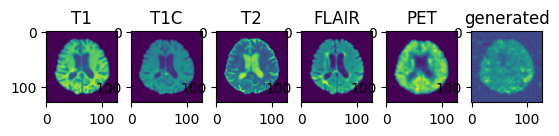

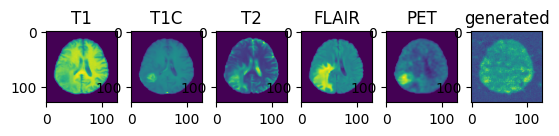

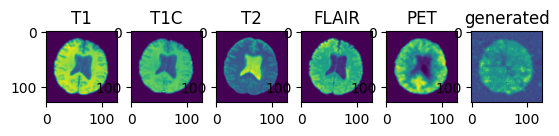

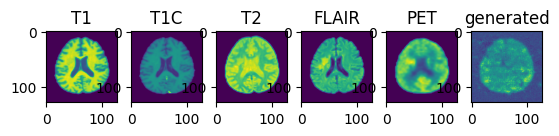

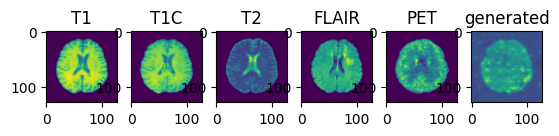

validation avg MS-SSIM: 0.4177 , train avg MS-SSIM: 0.4144
----------
epoch 231/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:22<15:04, 82.19s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:25<05:56, 35.66s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:28<03:07, 20.80s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:31<01:50, 13.81s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:34<01:09,  9.94s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:37<00:45,  7.62s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:41<00:31,  6.26s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:44<00:21,  5.25s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:47<00:13,  4.58s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:50<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:53<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 232/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:43, 80.31s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:23<05:48, 34.89s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:26<03:04, 20.54s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:29<01:49, 13.65s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:08,  9.84s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.54s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.13s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.49s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.06s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 233/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:32, 79.36s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:45, 34.52s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:01, 20.16s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.43s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.71s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.47s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.05s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.12s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.59s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.13s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.65s/it]

----------
epoch 234/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:07, 77.07s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:20<05:35, 33.58s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:23<02:56, 19.66s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:26<01:46, 13.26s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:29<01:07,  9.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:32<00:44,  7.39s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.06s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:42<00:13,  4.44s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:45<00:08,  4.02s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:48<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:50<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  9.46s/it]

----------
epoch 235/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:12, 77.47s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:20<05:37, 33.73s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:23<02:57, 19.76s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:26<01:45, 13.17s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:29<01:06,  9.54s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:32<00:44,  7.35s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.97s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.19s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:42<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:45<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:50<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.50s/it]

----------
epoch 236/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:23, 78.54s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:41, 34.18s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.47s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.75s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.49s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.06s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.13s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.08s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 237/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:20, 78.25s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:40, 34.05s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 19.92s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:46, 13.29s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.61s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.07s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.44s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.03s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  9.49s/it]

----------
epoch 238/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:24, 78.60s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:41, 34.19s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.48s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.74s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.48s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.05s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.11s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.48s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.05s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.76s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.57s/it]

----------
epoch 239/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:18, 78.07s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:39, 33.97s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:58, 19.88s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:46, 13.26s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.38s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.07s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.54s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.09s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.21s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 240/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:17, 77.91s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:39, 33.92s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:58, 19.84s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:45, 13.23s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.57s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.47s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:30,  6.04s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.10s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:42<00:13,  4.47s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.04s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.18s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  9.50s/it]

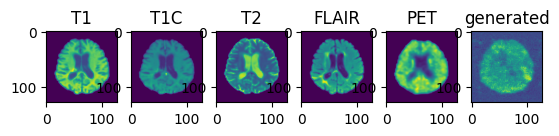

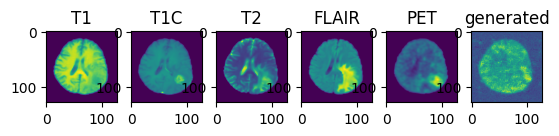

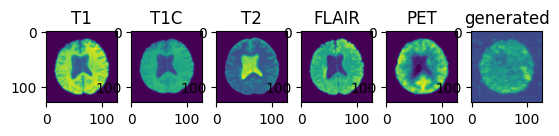

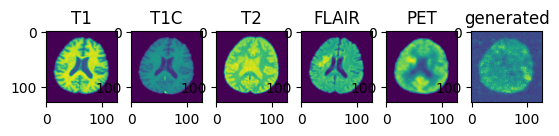

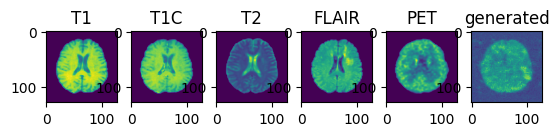

validation avg MS-SSIM: 0.4325 , train avg MS-SSIM: 0.4310
----------
epoch 241/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:17, 77.99s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:39, 33.93s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:58, 19.85s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:45, 13.24s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.58s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.37s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:30,  6.09s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.14s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.07s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 242/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:08, 77.11s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:20<05:35, 33.58s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:23<02:56, 19.66s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:26<01:46, 13.25s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:29<01:07,  9.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:32<00:44,  7.39s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.07s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:42<00:13,  4.45s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:45<00:08,  4.03s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:48<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:50<00:00,  3.27s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  9.47s/it]

----------
epoch 243/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:29, 79.05s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:43, 34.38s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:00, 20.09s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.39s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.68s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.44s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.02s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.21s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.10s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.78s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

----------
epoch 244/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:23, 78.51s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:41, 34.15s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 19.99s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.49s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:08,  9.76s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:45,  7.50s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.08s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.14s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.51s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.09s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 245/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:17, 77.98s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:39, 33.93s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:58, 19.86s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:45, 13.24s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.59s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.38s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.98s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.15s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.07s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.77s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.56s/it]

----------
epoch 246/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:23, 78.47s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:41, 34.15s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 20.00s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:46, 13.32s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.63s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.41s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:29,  6.00s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.08s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.45s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.03s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.83s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 247/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:19<14:35, 79.57s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:22<05:46, 34.61s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:25<03:02, 20.24s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:47, 13.48s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:32<01:08,  9.74s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:35<00:44,  7.50s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:38<00:30,  6.19s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:41<00:20,  5.21s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:44<00:13,  4.55s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.11s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:51<00:03,  3.81s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 248/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:17<14:16, 77.89s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:40, 34.08s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<02:59, 19.94s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:27<01:46, 13.29s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:30<01:07,  9.62s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:33<00:44,  7.40s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:36<00:29,  5.99s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:39<00:20,  5.07s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:42<00:13,  4.45s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:46<00:08,  4.03s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:49<00:03,  3.75s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.52s/it]

----------
epoch 249/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:18<14:26, 78.74s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:21<05:42, 34.25s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:24<03:00, 20.04s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:28<01:46, 13.35s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:31<01:07,  9.65s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:34<00:44,  7.42s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:37<00:30,  6.01s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:40<00:20,  5.21s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:43<00:13,  4.56s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:47<00:08,  4.12s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:50<00:03,  3.82s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.23s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.62s/it]

----------
epoch 250/250


Epoch :   0%|                                                                                                | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████▎                                                                                | 1/12 [01:20<14:49, 80.90s/it]

Epoch :  17%|██████████████▋                                                                         | 2/12 [01:24<05:51, 35.15s/it]

Epoch :  25%|██████████████████████                                                                  | 3/12 [01:27<03:05, 20.56s/it]

Epoch :  33%|█████████████████████████████▎                                                          | 4/12 [01:30<01:49, 13.67s/it]

Epoch :  42%|████████████████████████████████████▋                                                   | 5/12 [01:33<01:09,  9.86s/it]

Epoch :  50%|████████████████████████████████████████████                                            | 6/12 [01:36<00:45,  7.56s/it]

Epoch :  58%|███████████████████████████████████████████████████▎                                    | 7/12 [01:39<00:30,  6.10s/it]

Epoch :  67%|██████████████████████████████████████████████████████████▋                             | 8/12 [01:42<00:20,  5.14s/it]

Epoch :  75%|██████████████████████████████████████████████████████████████████                      | 9/12 [01:45<00:13,  4.50s/it]

Epoch :  83%|████████████████████████████████████████████████████████████████████████▌              | 10/12 [01:48<00:08,  4.08s/it]

Epoch :  92%|███████████████████████████████████████████████████████████████████████████████▊       | 11/12 [01:52<00:03,  3.86s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.26s/it]

Epoch : 100%|███████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

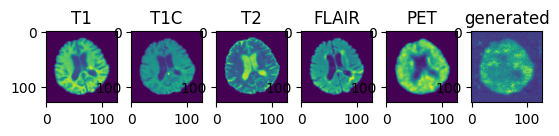

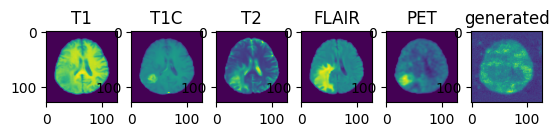

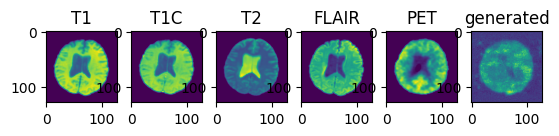

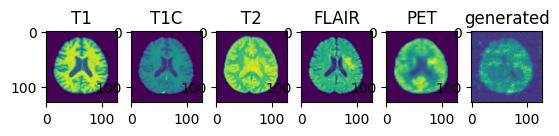

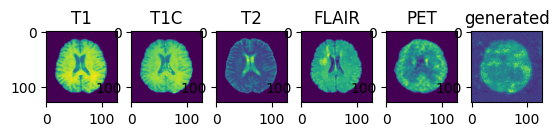

validation avg MS-SSIM: 0.4440 , train avg MS-SSIM: 0.4441


In [12]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 250
disc_train_interval = 1
disc_train_steps = 4
validation_interval = 10
best_ssim = 0.39
torch.cuda.empty_cache()

saved_dict = torch.load("./saved_models/experiment9.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])

for epoch in range(max_epochs):
    
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_images = gen_net(input_images)
        gen_opt.zero_grad()
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                dloss = discriminator_loss(gen_images, real_pet)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_train = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():

            for item in train_metric_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)
                
                generated = gen_net(input_images)
                ms_ssim_train.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))

            curr_ssim_train = torch.mean(torch.FloatTensor(ms_ssim_train))
            
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                
            curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

            if curr_ssim > best_ssim:
                best_ssim = curr_ssim
                torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f} , train avg MS-SSIM: {:.4f}".format(curr_ssim, curr_ssim_train))
            

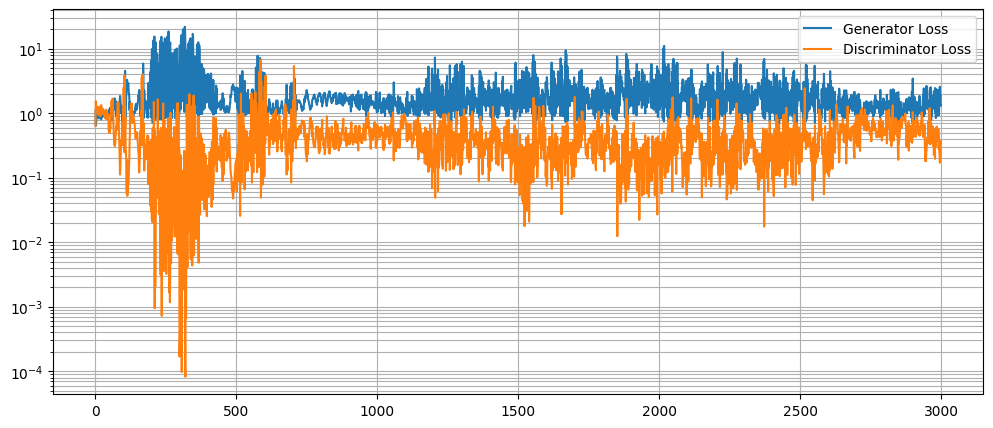

In [13]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

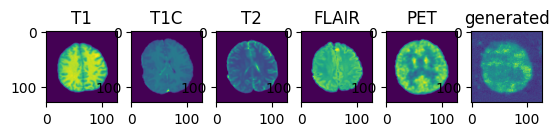

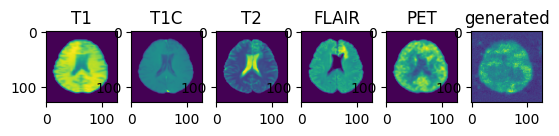

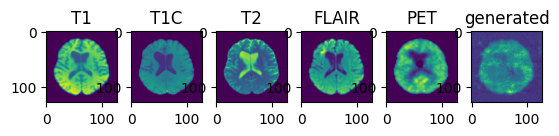

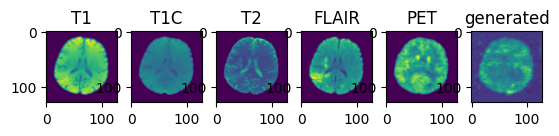

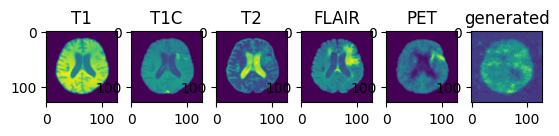

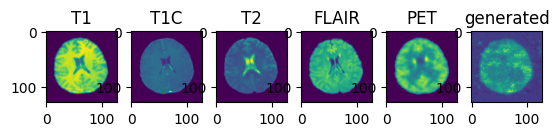

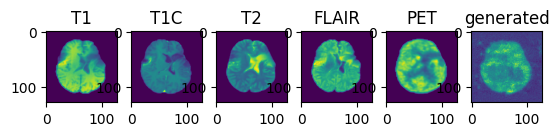

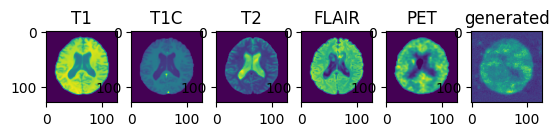

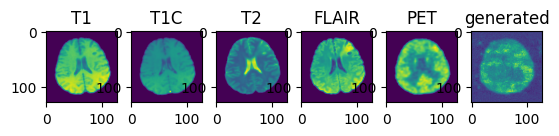

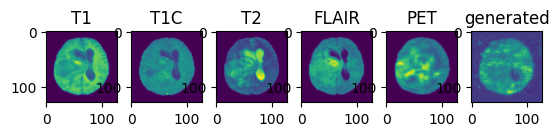

It has been 36020.38202357292 seconds since the loop started
validation avg MS-SSIM: 0.4540 validation avg MSE 0.0000


In [14]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))